In [ ]:
!pip install efficientnet_pytorch

  Preparing metadata (setup.py) ... done
  Created wheel for efficientnet_pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16428 sha256=26ccd5d71b22ea8796402837cfedb45db14f73f6db3a51a503683ccd4c5780c7
  Stored in directory: /root/.cache/pip/wheels/03/3f/e9/911b1bc46869644912bda90a56bcf7b960f20b5187feea3baf
Successfully built efficientnet_pytorch


In [ ]:
import copy
import datetime
import os
import random
import shutil
import time
import zipfile
from collections import Counter
from pathlib import Path

import numpy as np
from efficientnet_pytorch import EfficientNet
from PIL import Image
from sklearn.metrics import accuracy_score, confusion_matrix
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
from torchvision import datasets, models, transforms
import torch.utils.data as data
from torch.utils.data import ConcatDataset, DataLoader, Dataset, random_split

In [ ]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


**NOTE:** To reproduce the results, first execute the data collection segment using the data provided here: https://drive.google.com/drive/folders/1m3Za9ue349rEbIeZbpWwqXieFUNQHO27?usp=share_link. Following that, run the analysis segment with the weights available on GitHub. Adjust the paths to point to the data (ImageNet and VOC) and weights provided in GitHub.

## Define Global Parameters

In [ ]:
# Data-Related Parameters
NUM_CLASSES = 7
IMG_SIZE = 96
VAL_SPLIT = 0.10 # Proportion of dataset used for validation
# global mapping of class names to label index
CLASS_TO_IDX = {'airplane': 0, 'automobile': 1, 'bird': 2, 'cat': 3, 'dog': 4, 'horse': 5, 'ship': 6}
IDX_TO_CLASS = {v: k for k, v in CLASS_TO_IDX.items()}
CLASS_NAMES = list(CLASS_TO_IDX.keys())

# Training-Related Parameters
BATCH_SIZE = 64
LR = 0.0001
NUM_EPOCHS = 20
CKPT_INTERVAL = 5 # Interval (in epochs) for saving the model

# System-Related Parameters
DRIVE_PATH = '/content/drive/MyDrive/9.S912 Final Project'
NUM_WORKERS = 4       #
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

SEED = 42 # Seed for random number generator

# Set the seed for reproducibility
torch.manual_seed(SEED)

## Data Collection


In [ ]:
def copy_files_to_folder(source_folder, destination_folder):

    """Copy all files from source_folder to destination_folder."""

    os.makedirs(destination_folder, exist_ok=True)
    files_in_folder = os.listdir(source_folder)

    for file_name in files_in_folder:
        file_path = os.path.join(source_folder, file_name)
        shutil.copy(file_path, destination_folder)

In [ ]:
source_imagenet = f'{DRIVE_PATH}/compressed_imagenet_subset'
destination_imagenet = '/content/imagenet_subset/'
copy_files_to_folder(source_imagenet, destination_imagenet)

In [ ]:
source_voc = f'{DRIVE_PATH}/compressed_VOC'
destination_voc = '/content/voc_subset/'
copy_files_to_folder(source_voc, destination_voc)

Create train and test datsets from data.

In [ ]:
def extract_zip_file(zip_path, extract_to_dir):

    """Extracts a zip file to the specified directory."""

    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_to_dir)

def process_image_folder(folder_path, label_num):

    """Processes images in a folder into a dataset."""

    dataset = []
    if folder_path.exists():
        data = datasets.ImageFolder(folder_path)
        for sample in data.samples:
            image = Image.open(sample[0]).convert('RGB')
            dataset.append((image, label_num))
    return dataset

ImageNet data is extract from uploaded zip files.

In [ ]:
def process_imagenet_dataset(data_dir, folders_to_classes, dataset_type):
    dataset = []

    data_dir = Path(data_dir)
    extracted_dir = data_dir / f'extracted_{data_dir.name}'

    for folder_label, class_name in folders_to_classes.items():
        label_num = CLASS_TO_IDX[class_name]
        zip_path = data_dir / f'{folder_label}.zip'

        # Extract the zip file using the helper function
        extract_zip_file(zip_path, extracted_dir)

        # Move and process the folders
        if dataset_type == 'train' :
           train_old = extracted_dir / folder_label / 'train'
           train_new = extracted_dir / folder_label / 'train1'
           if train_old.exists():
            os.makedirs(train_new, exist_ok=True)
            shutil.move(str(train_old), str(train_new))
            dataset += process_image_folder(train_new, label_num)

        if dataset_type == 'test':
          test_old = extracted_dir / folder_label / 'test'
          test_new = extracted_dir / folder_label / 'test1'
          if test_old.exists():
            os.makedirs(test_new, exist_ok=True)
            shutil.move(str(test_old), str(test_new))
            dataset += process_image_folder(test_new, label_num)

    return dataset


In [ ]:
imagenet_data_dir = '/content/imagenet_subset/'
imagenet_folders_to_classes = {'n02691156':'airplane', 'n02958343':'automobile', 'n01503061':'bird',
                               'n02121620':'cat', 'sdd_subset':'dog', 'n02374451':'horse', 'n04194289':'ship'}

imagenet_train = process_imagenet_dataset(imagenet_data_dir, imagenet_folders_to_classes, 'train')
imagenet_test = process_imagenet_dataset(imagenet_data_dir, imagenet_folders_to_classes, 'test')

VOC data is extracted from uploaded zip files.

In [ ]:
def process_voc_dataset(data_dir, folders_to_classes):
    dataset = []
    data_dir = Path(data_dir)

    for folder_label, class_name in folders_to_classes.items():
        data_path = data_dir / f'{folder_label}.zip'
        label_num = CLASS_TO_IDX[class_name]

        extract_zip_file(data_path, data_dir)

        class_folder = data_dir / folder_label
        test_folder = data_dir / 'test' / folder_label

        if class_folder.exists():
            os.makedirs(test_folder, exist_ok=True)
            shutil.move(str(class_folder), str(test_folder))

        dataset += process_image_folder(test_folder, label_num)

    return dataset

In [ ]:
voc_data_dir = '/content/voc_subset/'
voc_folders_to_classes = {'airplane':'airplane', 'automobile':'automobile', 'bird':'bird',
                          'cat':'cat', 'dog':'dog', 'horse':'horse', 'ship':'ship'}

voc_test = process_voc_dataset(voc_data_dir, voc_folders_to_classes)

CIFAR data is loaded from torch.
Some classes needed to be removed and labels remapped since the entire dataset is downloaded.

In [ ]:
def get_indices(dataset, class_index):

    """Get indices of all occurrences of a given class in the dataset."""

    labels = np.array(dataset.targets)
    return np.where(labels == class_index)[0].tolist()


def remap_labels(dataset, remapping):

    """Remap dataset labels based on the provided mapping."""

    labels_copy = dataset.targets.copy()
    for (old, new) in remapping:
        if old != new:
            old_indices = get_indices(dataset, old)
            for i in old_indices:
                labels_copy[i] = new
    dataset.targets = labels_copy
    return dataset

In [ ]:
def process_cifar_dataset(dataset_type):

    is_train = dataset_type == "train"

    dataset = torchvision.datasets.CIFAR10(root='./data', train=is_train, download=True)

    # Define remapping and classes to remove
    cifar_remapping = [(5, 4), (7, 5), (8, 6)]  # Mapping for label remapping
    classes_to_remove = {4, 6, 9}  # Classes to be removed

    # Remove specified classes
    dataset.data = [sample for i, sample in enumerate(dataset.data)
                    if dataset.targets[i] not in classes_to_remove]
    dataset.targets = [label for label in dataset.targets
                       if label not in classes_to_remove]

    # Remap labels
    labels_copy = dataset.targets.copy()
    for (old, new) in cifar_remapping:
        if old != new:
            old_indices = np.where(np.array(labels_copy) == old)[0]
            for i in old_indices:
                labels_copy[i] = new
    dataset.targets = labels_copy

    return dataset


In [ ]:
cifar_train = process_cifar_dataset("train")
cifar_test = process_cifar_dataset("test")

100%|██████████| 170498071/170498071 [00:11<00:00, 14318159.64it/s]


Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified


Datasets are balanced to ensure equal amount of data  for each class is represented.

In [ ]:
def sum_nested_dict(dictionary):

    """Sum all integer values in a nested dictionary."""

    total = 0
    for value in dictionary.values():
        if isinstance(value, dict):
            total += sum_nested_dict(value)
        elif isinstance(value, int):
            total += value
    return total

def balance_datasets(*datasets):

    """Balance the given datasets to have approximately the same number of samples for each class."""

    class_counts_datasets = {}

    # Count the samples per class in each dataset
    for i, dataset in enumerate(datasets):
        dataset_key = f'dataset{i+1}'
        for sample, label in dataset:
            label = int(label)
            class_counts_datasets.setdefault(dataset_key, {}).setdefault(label, 0)
            class_counts_datasets[dataset_key][label] += 1

    # Calculate average class count
    avg_class_count = int(sum_nested_dict(class_counts_datasets) / (len(datasets) * NUM_CLASSES))

    # Balance each dataset
    balanced_datasets = []
    for dataset in datasets:
        balanced_dataset = []
        for label in range(NUM_CLASSES):
            class_samples = [sample for sample, lbl in dataset if int(lbl) == label]
            if len(class_samples) < avg_class_count:
                repeat_num = avg_class_count // len(class_samples)
                selected_samples = class_samples * repeat_num + random.sample(class_samples, avg_class_count - repeat_num * len(class_samples))
            else:
                selected_samples = random.sample(class_samples, avg_class_count)
            balanced_dataset.extend([(sample, label) for sample in selected_samples])
        balanced_datasets.append(balanced_dataset)

    return balanced_datasets


In [ ]:
imagenet_train_balanced, cifar_train_balanced = balance_datasets(imagenet_train, cifar_train)

In [ ]:
print(f"ImageNet train: {len(imagenet_train_balanced)}")
print(f"CIFAR train: {len(cifar_train_balanced)}")

ImageNet train: 21518
CIFAR train: 21518


In [ ]:
imagenet_test_balanced, cifar_test_balanced, voc_test_balanced = balance_datasets(imagenet_test, cifar_test, voc_test)

In [ ]:
print(f"ImageNet test: {len(imagenet_test_balanced)}")
print(f"CIFAR test: {len(cifar_test_balanced)}")
print(f"VOC test: {len(voc_test_balanced)}")

ImageNet test: 5341
CIFAR test: 5341
VOC test: 5341


Data transformations are applied to train and test datasets to increase data diversity.

In [ ]:
class TransformDataset(Dataset):
    def __init__(self, base_dataset, transform=None):
        self.base_dataset = base_dataset
        self.transform = transform

    def __len__(self):
        return len(self.base_dataset)

    def __getitem__(self, idx):
        image, label = self.base_dataset[idx]
        if self.transform:
            image = self.transform(image)
        return image, label

In [ ]:
transform = transforms.Compose([
    transforms.Resize(int(IMG_SIZE * 1.25)),
    transforms.RandomCrop(IMG_SIZE),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1),
    transforms.RandomRotation(degrees=(0, 180)),
    transforms.RandomAffine(degrees=0, translate=(0.1, 0.1)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

transform_test = transforms.Compose([
    transforms.Resize(int(IMG_SIZE * 1.25)),
    transforms.CenterCrop(IMG_SIZE),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [ ]:
imagenet_train_balanced = TransformDataset(imagenet_train_balanced, transform=transform)
cifar_train_balanced = TransformDataset(cifar_train_balanced, transform=transform)

imagenet_test_balanced = TransformDataset(imagenet_test_balanced, transform=transform_test)
cifar_test_balanced = TransformDataset(cifar_test_balanced, transform=transform_test)
voc_test_balanced = TransformDataset(voc_test_balanced, transform=transform_test)

Validation datsets are created from train datasets.

In [ ]:
def calc_split_size(dataset):

    """Calculate the sizes for training and validation splits based on a predefined split ratio."""

    val_size = int(len(dataset) * VAL_SPLIT)
    train_size = len(dataset) - val_size

    return train_size, val_size


In [ ]:
cifar_train_size, cifar_val_size = calc_split_size(cifar_train_balanced)
cifar_train_balanced, cifar_val_balanced = random_split(cifar_train_balanced, [cifar_train_size, cifar_val_size])


imagenet_train_size, imagenet_val_size = calc_split_size(imagenet_train_balanced)
imagenet_train_balanced, imagenet_val_balanced = random_split(imagenet_train_balanced, [imagenet_train_size, imagenet_val_size])

In [ ]:
voc_test_loader = DataLoader(voc_test_balanced, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS)

cifar_train_loader = DataLoader(cifar_train_balanced, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS)
cifar_test_loader = DataLoader(cifar_test_balanced, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS)
cifar_val_loader = DataLoader(cifar_val_balanced, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS)

imagenet_train_loader = DataLoader(imagenet_train_balanced, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS)
imagenet_test_loader = DataLoader(imagenet_test_balanced, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS)
imagenet_val_loader = DataLoader(imagenet_val_balanced, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS)

## Model Training and Evaluation

EfficentNet is loaded and adjust for number of classes.

In [ ]:
model = EfficientNet.from_pretrained('efficientnet-b0')
model._fc = nn.Linear(in_features=model._fc.in_features, out_features=NUM_CLASSES)
model.to(DEVICE)

Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b0-355c32eb.pth" to /root/.cache/torch/hub/checkpoints/efficientnet-b0-355c32eb.pth
100%|██████████| 20.4M/20.4M [00:00<00:00, 45.5MB/s]


Loaded pretrained weights for efficientnet-b0


EfficientNet(
  (_conv_stem): Conv2dStaticSamePadding(
    3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False
    (static_padding): ZeroPad2d((0, 1, 0, 1))
  )
  (_bn0): BatchNorm2d(32, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
  (_blocks): ModuleList(
    (0): MBConvBlock(
      (_depthwise_conv): Conv2dStaticSamePadding(
        32, 32, kernel_size=(3, 3), stride=[1, 1], groups=32, bias=False
        (static_padding): ZeroPad2d((1, 1, 1, 1))
      )
      (_bn1): BatchNorm2d(32, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
      (_se_reduce): Conv2dStaticSamePadding(
        32, 8, kernel_size=(1, 1), stride=(1, 1)
        (static_padding): Identity()
      )
      (_se_expand): Conv2dStaticSamePadding(
        8, 32, kernel_size=(1, 1), stride=(1, 1)
        (static_padding): Identity()
      )
      (_project_conv): Conv2dStaticSamePadding(
        32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False
    

In [ ]:
# hyper parameters are defined
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=LR)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=30, gamma=0.1)

In [ ]:
CKPT_BASE = f'/{DRIVE_PATH}/checkpoints/cnn'
curr_date = datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S")

phase_1_dir = Path(CKPT_BASE, curr_date, "phase_1")
phase_2_dir = Path(CKPT_BASE, curr_date, "phase_2")

os.makedirs(phase_1_dir, exist_ok=True)
os.makedirs(phase_2_dir, exist_ok=True)

In [ ]:
def train_model(model, train_loader, val_loader):
    start_time = time.time()
    for epoch in range(NUM_EPOCHS):
        # Train
        running_loss = 0.0
        for i, (inputs, labels) in enumerate(train_loader):
            model.train()
            inputs, labels = inputs.to(DEVICE), labels.to(DEVICE)

            optimizer.zero_grad()

            outputs = model(inputs)
            loss = criterion(outputs, labels)

            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        scheduler.step()

        # Validation
        model.eval()
        val_loss = 0.0
        correct = 0
        total = 0
        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs, labels = inputs.to(DEVICE), labels.to(DEVICE)
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                val_loss += loss.item()
                _, predicted = torch.max(outputs.data, 1)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()

        val_accuracy = 100 * correct / total
        print(f'Epoch {epoch+1}, Train Loss: {running_loss / len(imagenet_train_loader):.2f}, Val Loss: {val_loss / len(imagenet_val_loader):.2f}, Val Accuracy: {val_accuracy:.2f}%')


        if (epoch + 1) % CKPT_INTERVAL == 0:
            # Save checkpoint
            checkpoint_path = f"model_checkpoint_epoch{epoch+1}.pth"
            checkpoint_path = os.path.join(phase_1_dir, checkpoint_path)
            torch.save(model.state_dict(), checkpoint_path)
            print(f"Checkpoint saved at {checkpoint_path}")

    end_time = time.time()
    training_time = end_time - start_time
    print(f"Training time: {training_time} seconds")

    return model

In [ ]:
def evaluate_model(model, data_loader, criterion):

    """ Evaluate the model on the given data loader and return the average loss, accuracy, class-wise accuracies, and confusion matrix."""

    model.eval()
    total_loss = 0
    all_labels = []
    all_preds = []
    class_correct = np.zeros(NUM_CLASSES)
    class_total = np.zeros(NUM_CLASSES)

    with torch.no_grad():
        for data in data_loader:
            inputs, labels = data[0], data[1]
            inputs, labels = inputs.to(DEVICE), labels.to(DEVICE)

            outputs = model(inputs)
            loss = criterion(outputs, labels)
            total_loss += loss.item()

            _, preds = torch.max(outputs, 1)
            correct = preds == labels

            for label, correct in zip(labels, correct):
                class_correct[label] += correct.item()
                class_total[label] += 1

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())

    accuracy = accuracy_score(all_labels, all_preds)
    class_accuracies = class_correct / class_total
    conf_matrix = confusion_matrix(all_labels, all_preds)
    avg_loss = total_loss / len(data_loader)

    print(f"Average loss: {avg_loss:.2f}")
    print(f"Accuracy: {accuracy:.2f}%")
    print(f"Class-wise accuracies: {class_accuracies}")
    print(f"Confusion matrix:")
    print(conf_matrix)
    print("-" * 50)

    return avg_loss, accuracy, class_accuracies, conf_matrix


**Phase 1:** Train on ImageNet and Evaluate on ImageNet, CIFAR, VOC

In [ ]:
model = train_model(model, imagenet_train_loader, imagenet_val_loader)

Epoch 1, Train Loss: 1.09, Val Loss: 0.62, Val Accuracy: 77.55%
Epoch 2, Train Loss: 0.61, Val Loss: 0.47, Val Accuracy: 83.40%
Epoch 3, Train Loss: 0.51, Val Loss: 0.44, Val Accuracy: 84.57%
Epoch 4, Train Loss: 0.44, Val Loss: 0.37, Val Accuracy: 87.12%
Epoch 5, Train Loss: 0.39, Val Loss: 0.35, Val Accuracy: 87.87%
Checkpoint saved at //content/drive/MyDrive/9.S912 Final Project/checkpoints/cnn/2023-12-14_07-25-36/phase_1/model_checkpoint_epoch5.pth
Epoch 6, Train Loss: 0.36, Val Loss: 0.30, Val Accuracy: 89.26%
Epoch 7, Train Loss: 0.33, Val Loss: 0.27, Val Accuracy: 90.52%
Epoch 8, Train Loss: 0.29, Val Loss: 0.26, Val Accuracy: 90.52%
Epoch 9, Train Loss: 0.28, Val Loss: 0.25, Val Accuracy: 91.31%
Epoch 10, Train Loss: 0.25, Val Loss: 0.25, Val Accuracy: 90.93%
Checkpoint saved at //content/drive/MyDrive/9.S912 Final Project/checkpoints/cnn/2023-12-14_07-25-36/phase_1/model_checkpoint_epoch10.pth
Epoch 11, Train Loss: 0.23, Val Loss: 0.21, Val Accuracy: 92.33%
Epoch 12, Train Los

In [ ]:
evaluate_model(model, imagenet_test_loader, criterion)

Average loss: 0.28
Accuracy: 0.92%
Class-wise accuracies: [0.88990826 0.96592398 0.90301442 0.88335518 0.93184797 0.89515072
 0.96330275]
Confusion matrix:
[[679  28  28   2   0  10  16]
 [ 13 737   0   3   0   3   7]
 [  7   2 689  26  12  25   2]
 [  2   2  22 674  48  13   2]
 [  0   2   0  24 711  26   0]
 [ 12  11  15  11  26 683   5]
 [  6  10   0   2   0  10 735]]
--------------------------------------------------


(0.281926086715733,
 0.9189290395057106,
 array([0.88990826, 0.96592398, 0.90301442, 0.88335518, 0.93184797,
        0.89515072, 0.96330275]),
 array([[679,  28,  28,   2,   0,  10,  16],
        [ 13, 737,   0,   3,   0,   3,   7],
        [  7,   2, 689,  26,  12,  25,   2],
        [  2,   2,  22, 674,  48,  13,   2],
        [  0,   2,   0,  24, 711,  26,   0],
        [ 12,  11,  15,  11,  26, 683,   5],
        [  6,  10,   0,   2,   0,  10, 735]]))

In [ ]:
evaluate_model(model, cifar_test_loader, criterion)

Average loss: 2.55
Accuracy: 0.55%
Class-wise accuracies: [0.52686763 0.77195282 0.61861075 0.88073394 0.02359109 0.5740498
 0.43774574]
Confusion matrix:
[[402  21  93 163   0  60  24]
 [ 24 589  18 106   0  24   2]
 [ 22   1 472 217   1  49   1]
 [  3   4  41 672   1  42   0]
 [  3   5  63 623  18  50   1]
 [  4   5  65 246   5 438   0]
 [100  69  28 203   0  29 334]]
--------------------------------------------------


(2.5524825400539806,
 0.5476502527616551,
 array([0.52686763, 0.77195282, 0.61861075, 0.88073394, 0.02359109,
        0.5740498 , 0.43774574]),
 array([[402,  21,  93, 163,   0,  60,  24],
        [ 24, 589,  18, 106,   0,  24,   2],
        [ 22,   1, 472, 217,   1,  49,   1],
        [  3,   4,  41, 672,   1,  42,   0],
        [  3,   5,  63, 623,  18,  50,   1],
        [  4,   5,  65, 246,   5, 438,   0],
        [100,  69,  28, 203,   0,  29, 334]]))

In [ ]:
evaluate_model(model, voc_test_loader, criterion)

Average loss: 1.08
Accuracy: 0.74%
Class-wise accuracies: [0.87024902 0.62909567 0.74180865 0.83486239 0.5819135  0.88990826
 0.64875491]
Confusion matrix:
[[664  23  21   0   4   8  43]
 [ 70 480   9  25  28  67  84]
 [ 36   8 566  47  30  59  17]
 [  7  14  15 637  81   8   1]
 [  8  14  16 203 444  73   5]
 [ 23   8   8  21  22 679   2]
 [ 98  38  46  22  14  50 495]]
--------------------------------------------------


(1.0840414259582758,
 0.7423703426324658,
 array([0.87024902, 0.62909567, 0.74180865, 0.83486239, 0.5819135 ,
        0.88990826, 0.64875491]),
 array([[664,  23,  21,   0,   4,   8,  43],
        [ 70, 480,   9,  25,  28,  67,  84],
        [ 36,   8, 566,  47,  30,  59,  17],
        [  7,  14,  15, 637,  81,   8,   1],
        [  8,  14,  16, 203, 444,  73,   5],
        [ 23,   8,   8,  21,  22, 679,   2],
        [ 98,  38,  46,  22,  14,  50, 495]]))

**Phase 2:** Train on ImageNet, CIFAR and Evaluate on ImageNet, CIFAR, VOC

In [ ]:
combined_cifar_imagenet_train = ConcatDataset([cifar_train_balanced, imagenet_train_balanced])
combined_cifar_imagenet_val = ConcatDataset([cifar_val_balanced, imagenet_val_balanced])

combined_cifar_imagenet_train_loader = torch.utils.data.DataLoader(combined_cifar_imagenet_train, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS)
combined_cifar_imagenet_val_loader = torch.utils.data.DataLoader(combined_cifar_imagenet_val, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS)

In [ ]:
model = train_model(model, combined_cifar_imagenet_train_loader, combined_cifar_imagenet_val_loader)

Epoch 1, Train Loss: 0.97, Val Loss: 0.72, Val Accuracy: 87.12%
Epoch 2, Train Loss: 0.74, Val Loss: 0.62, Val Accuracy: 88.75%
Epoch 3, Train Loss: 0.67, Val Loss: 0.57, Val Accuracy: 89.54%
Epoch 4, Train Loss: 0.62, Val Loss: 0.55, Val Accuracy: 90.24%
Epoch 5, Train Loss: 0.58, Val Loss: 0.52, Val Accuracy: 90.82%
Checkpoint saved at //content/drive/MyDrive/9.S912 Final Project/checkpoints/cnn/2023-12-14_07-25-36/phase_1/model_checkpoint_epoch5.pth
Epoch 6, Train Loss: 0.54, Val Loss: 0.53, Val Accuracy: 90.61%
Epoch 7, Train Loss: 0.52, Val Loss: 0.51, Val Accuracy: 91.21%
Epoch 8, Train Loss: 0.49, Val Loss: 0.50, Val Accuracy: 91.05%
Epoch 9, Train Loss: 0.47, Val Loss: 0.47, Val Accuracy: 91.40%
Epoch 10, Train Loss: 0.45, Val Loss: 0.47, Val Accuracy: 91.21%
Checkpoint saved at //content/drive/MyDrive/9.S912 Final Project/checkpoints/cnn/2023-12-14_07-25-36/phase_1/model_checkpoint_epoch10.pth
Epoch 11, Train Loss: 0.41, Val Loss: 0.42, Val Accuracy: 92.49%
Epoch 12, Train Los

In [ ]:
evaluate_model(model, imagenet_test_loader, criterion)

Average loss: 0.29
Accuracy: 0.92%
Class-wise accuracies: [0.90039318 0.95150721 0.91874181 0.87549148 0.92791612 0.89777195
 0.96068152]
Confusion matrix:
[[687  26  24   4   0   6  16]
 [  9 726   2   8   0   6  12]
 [  7   2 701  21  10  22   0]
 [  0   6  22 668  48  17   2]
 [  0   3   2  35 708  15   0]
 [  9   6  21   8  27 685   7]
 [ 10   5   5   0   0  10 733]]
--------------------------------------------------


(0.2936369502207353,
 0.9189290395057106,
 array([0.90039318, 0.95150721, 0.91874181, 0.87549148, 0.92791612,
        0.89777195, 0.96068152]),
 array([[687,  26,  24,   4,   0,   6,  16],
        [  9, 726,   2,   8,   0,   6,  12],
        [  7,   2, 701,  21,  10,  22,   0],
        [  0,   6,  22, 668,  48,  17,   2],
        [  0,   3,   2,  35, 708,  15,   0],
        [  9,   6,  21,   8,  27, 685,   7],
        [ 10,   5,   5,   0,   0,  10, 733]]))

In [ ]:
evaluate_model(model, cifar_test_loader, criterion)

Average loss: 0.26
Accuracy: 0.91%
Class-wise accuracies: [0.9095675  0.9921363  0.93184797 0.81520315 0.85976409 0.94102228
 0.93315858]
Confusion matrix:
[[694  11  19  10   3   1  25]
 [  2 757   1   0   0   0   3]
 [  9   0 711  27  11   4   1]
 [  3   5  36 622  85  11   1]
 [  3   1  13  68 656  22   0]
 [  6   4   7   5  21 718   2]
 [ 30  12   7   1   0   1 712]]
--------------------------------------------------


(0.2586602780114238,
 0.9118142669912002,
 array([0.9095675 , 0.9921363 , 0.93184797, 0.81520315, 0.85976409,
        0.94102228, 0.93315858]),
 array([[694,  11,  19,  10,   3,   1,  25],
        [  2, 757,   1,   0,   0,   0,   3],
        [  9,   0, 711,  27,  11,   4,   1],
        [  3,   5,  36, 622,  85,  11,   1],
        [  3,   1,  13,  68, 656,  22,   0],
        [  6,   4,   7,   5,  21, 718,   2],
        [ 30,  12,   7,   1,   0,   1, 712]]))

In [ ]:
evaluate_model(model, voc_test_loader, criterion)

Average loss: 1.13
Accuracy: 0.76%
Class-wise accuracies: [0.88466579 0.61598952 0.79292267 0.85976409 0.58846658 0.87024902
 0.68152031]
Confusion matrix:
[[675  16  24   2   4   4  38]
 [ 66 470  13  29  29  66  90]
 [ 27  10 605  31  29  39  22]
 [  6  13  21 656  61   5   1]
 [  7  11  25 195 449  70   6]
 [ 16  13  14  25  25 664   6]
 [ 85  44  44  19  14  37 520]]
--------------------------------------------------


(1.127111757351529,
 0.7562254259501966,
 array([0.88466579, 0.61598952, 0.79292267, 0.85976409, 0.58846658,
        0.87024902, 0.68152031]),
 array([[675,  16,  24,   2,   4,   4,  38],
        [ 66, 470,  13,  29,  29,  66,  90],
        [ 27,  10, 605,  31,  29,  39,  22],
        [  6,  13,  21, 656,  61,   5,   1],
        [  7,  11,  25, 195, 449,  70,   6],
        [ 16,  13,  14,  25,  25, 664,   6],
        [ 85,  44,  44,  19,  14,  37, 520]]))

## Analysis

In [ ]:
%pip install grad-cam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 51.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.4.8-py3-none-any.whl size=38243 sha256=035474b3d6dc72c28864d4506d8d3e61f933f523464fd2294eecba444a8fc646
  Stored in directory: /root/.cache/pip/wheels/f8/04/36/94ff3c8a4215826a21946b34c01180817e606989fdf53f7cd6
Successfully built grad-cam


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
import cv2
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

In [ ]:
class DatasetWithID(Dataset):
    def __init__(self, dataset, dataset_id):
        self.dataset = dataset
        self.dataset_id = dataset_id

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        data, label = self.dataset[idx]
        return data, label, self.dataset_id

imagenet_with_id = DatasetWithID(imagenet_test_balanced, 0)
cifar_with_id = DatasetWithID(cifar_test_balanced, 1)
voc_with_id = DatasetWithID(voc_test_balanced, 2)

complete_dataset = ConcatDataset([imagenet_with_id, cifar_with_id, voc_with_id])
complete_dataloader = DataLoader(complete_dataset, batch_size=BATCH_SIZE, num_workers=NUM_WORKERS, shuffle=False)

imagenet_loader = DataLoader(imagenet_with_id, batch_size=BATCH_SIZE, num_workers=NUM_WORKERS, shuffle=False)
cifar_loader = DataLoader(cifar_with_id, batch_size=BATCH_SIZE,num_workers=NUM_WORKERS, shuffle=False)
voc_loader = DataLoader(voc_with_id, batch_size=BATCH_SIZE, num_workers=NUM_WORKERS, shuffle=False)

dataloaders = {'ImageNet': imagenet_loader, 'CIFAR': cifar_loader, 'VOC': voc_loader}
DATASET_NAMES = list(dataloaders.keys())

### Image Distribution

Visualize data distribution based on color, texture, and edges.

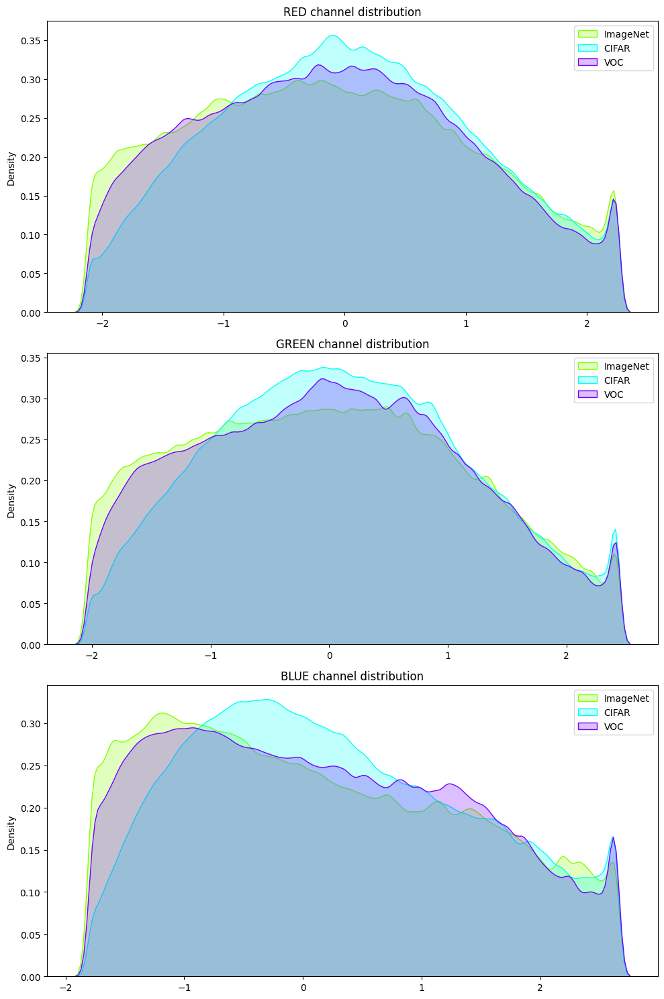

In [ ]:
def extract_rgb_values(dataloader, num_samples=50):

    """ Extract RGB values from a specified number of images in the dataloader."""

    rgb_values = []

    for i, (images, _, _) in enumerate(dataloader):
        if i >= num_samples:
            break
        # Change from (B, C, H, W) format to (B, H, W, C) to handle RGB channels
        images = images.permute(0, 2, 3, 1)

        images = images.reshape(-1, 3)
        rgb_values.append(images)

    return torch.cat(rgb_values, dim=0).numpy()



palette = sns.color_palette("hsv", len(dataloaders))

fig, axes = plt.subplots(3, 1, figsize=(10, 15))
colors = ['Red', 'Green', 'Blue']  # Colors for channel titles

for i, (loader_name, dataloader) in enumerate(dataloaders.items()):
    rgb_values = extract_rgb_values(dataloader)
    for j, channel in enumerate(colors):
        # Use the distinct color for each dataloader
        sns.kdeplot(rgb_values[:, j], ax=axes[j], color=palette[i], fill=True, label=loader_name)
        axes[j].set_title(f'{channel.upper()} channel distribution')
        axes[j].legend()

plt.tight_layout()
plt.show()

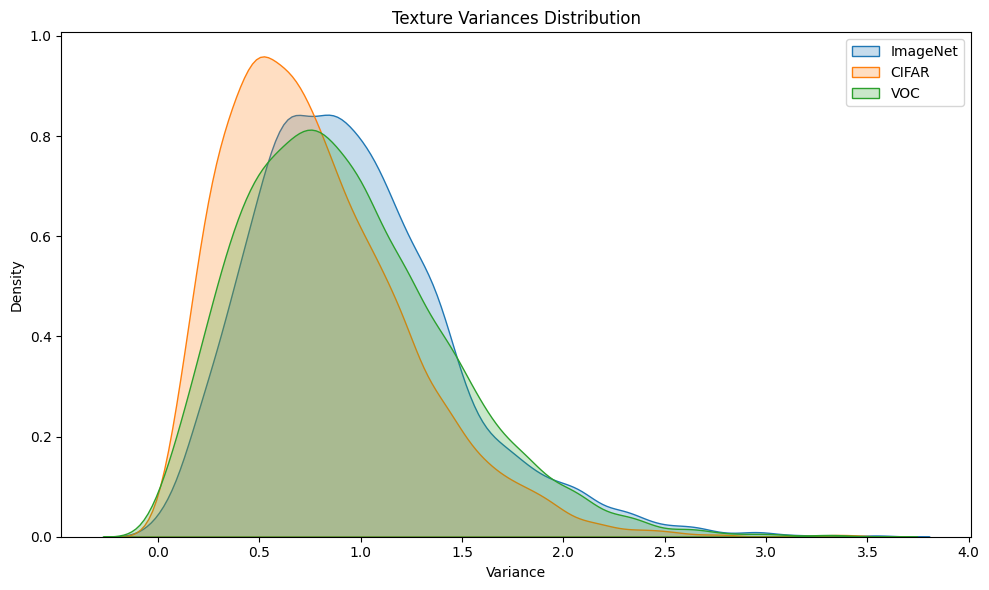

In [ ]:
def extract_texture_variance(dataloader):

    """Calculate the texture variance of grayscale images from the given dataloader."""

    variances = []

    for images, _, _ in dataloader:
        for img_tensor in images:
            img = img_tensor.permute(1, 2, 0).numpy()
            gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
            variances.append(np.var(gray_img))

    return np.array(variances)


plt.figure(figsize=(10, 6))

for loader_name, dataloader in dataloaders.items():
    textures = extract_texture_variance(dataloader)
    sns.kdeplot(textures, fill=True, label=loader_name)

plt.title('Texture Variances Distribution')
plt.xlabel('Variance')
plt.ylabel('Density')
plt.legend()
plt.tight_layout()
plt.show()

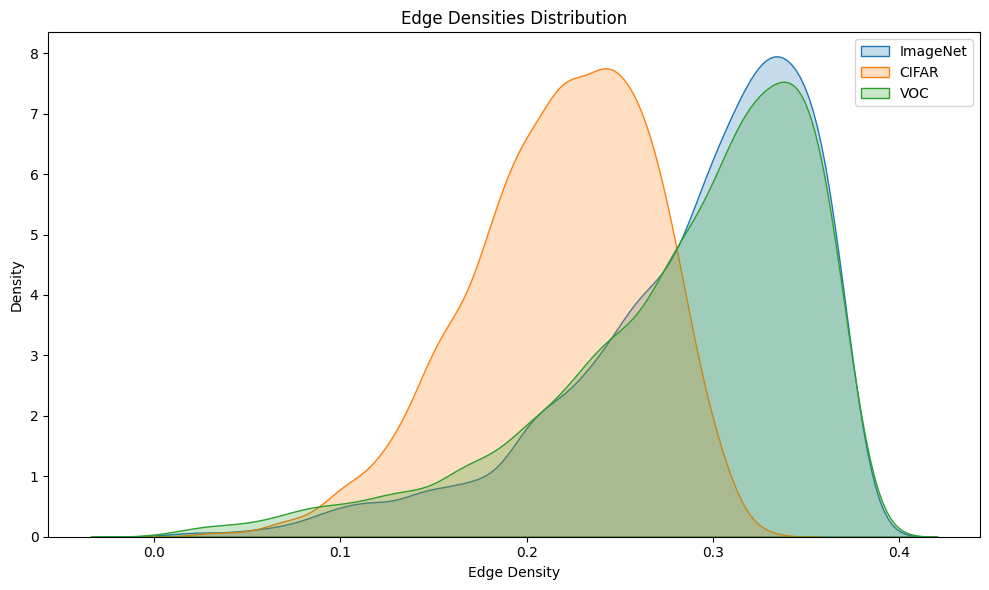

In [ ]:
def calculate_edge_density(image):

    """Calculate the edge density of an image represented by the given image."""

    image = image.permute(1, 2, 0).numpy() * 255
    image = image.astype(np.uint8)

    gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # Apply the Canny edge detector to the grayscale image
    edges = cv2.Canny(gray_image, 100, 200)

    # Calculate the proportion of edge pixels to total pixels
    edge_density = np.sum(edges > 0) / float(edges.size)

    return edge_density

def extract_edge_distributions(dataloader):

    """Extract edge densities for each image in the given dataloader."""

    edge_densities = []

    for images, _, _ in dataloader:
        for image in images:
            edge_density = calculate_edge_density(image)
            edge_densities.append(edge_density)

    return edge_densities


plt.figure(figsize=(10, 6))

for loader_name, dataloader in dataloaders.items():
  edges = extract_edge_distributions(dataloader)
  sns.kdeplot(edges, fill=True, label=loader_name)

plt.title('Edge Densities Distribution')
plt.xlabel('Edge Density')
plt.ylabel('Density')
plt.legend()

plt.tight_layout()
plt.show()

### Performance

Identify performance metrics across datasets, classes, etc.

In [ ]:
CKPT_DIR = f"{CKPT_BASE}/2023-12-11_04-31-01"

phase_1_dir = os.path.join(CKPT_DIR, "phase_1")
phase_2_dir = os.path.join(CKPT_DIR, "phase_2")

p1_files_in_folder = os.listdir(phase_1_dir)
p2_files_in_folder = os.listdir(phase_2_dir)

p1_checkpoints = [os.path.join(phase_1_dir, f) for f in p1_files_in_folder if f.endswith('.pth')]
p2_checkpoints = [os.path.join(phase_2_dir, f) for f in p2_files_in_folder if f.endswith('.pth')]

checkpoints = p1_checkpoints + p2_checkpoints

# Mapping each checkpoint to a number
checkpoint_to_filename = {i: ckpt for i, ckpt in enumerate(checkpoints, start=5)}

In [ ]:
loss_per_checkpoint = {}
accuracy_per_checkpoint = {}
class_accuracies_per_checkpoint = {}
conf_matrix_per_checkpoint = {}

# Evaluate model on each checkpoint and store metrics
for checkpoint_num, checkpoint_path in checkpoint_to_filename.items():
    checkpoint = torch.load(checkpoint_path)
    model.load_state_dict(checkpoint)

    for loader_name, dataloader in dataloaders.items():
        print(loader_name)
        loss, accuracy, class_accuracies, conf_matrix = evaluate_model(model, dataloader, criterion)
        loss_per_checkpoint.setdefault(checkpoint_num, {})[loader_name] = loss
        accuracy_per_checkpoint.setdefault(checkpoint_num, {})[loader_name] = accuracy
        class_accuracies_per_checkpoint.setdefault(checkpoint_num, {})[loader_name] = class_accuracies
        conf_matrix_per_checkpoint.setdefault(checkpoint_num, {})[loader_name] = conf_matrix


ImageNet
Average loss: 0.25
Accuracy: 0.92%
Class-wise accuracies: [0.90694626 0.97771953 0.90825688 0.84927916 0.92267366 0.89252949
 0.9593709 ]
Confusion matrix:
[[692  31  10   0   0   8  22]
 [  2 746   0   3   3   0   9]
 [ 13   4 693  11  13  24   5]
 [  0   2  24 648  72  17   0]
 [  0   0   4  15 704  40   0]
 [ 13  12   4  15  28 681  10]
 [  8  14   3   3   0   3 732]]
--------------------------------------------------
CIFAR
Average loss: 1.53
Accuracy: 0.55%
Class-wise accuracies: [0.53604194 0.64220183 0.69331586 0.93971166 0.08256881 0.6068152
 0.38401048]
Confusion matrix:
[[409   4 163 136   0  38  13]
 [ 43 490  16 203   0   9   2]
 [  8   0 529 186   4  36   0]
 [  3   0  27 717   2  14   0]
 [  3   0  27 644  63  26   0]
 [  3   0  32 243  21 463   1]
 [123  16  71 239   0  21 293]]
--------------------------------------------------
VOC
Average loss: 0.76
Accuracy: 0.77%
Class-wise accuracies: [0.88597641 0.65268676 0.76933159 0.8112713  0.63302752 0.89908257
 0.7182

In [ ]:
dataset_plotting_shape = {
    'ImageNet': '*',
    'CIFAR': 'd',
    'VOC': 'o'
}

Plot accuracy at every checkpoint interval.

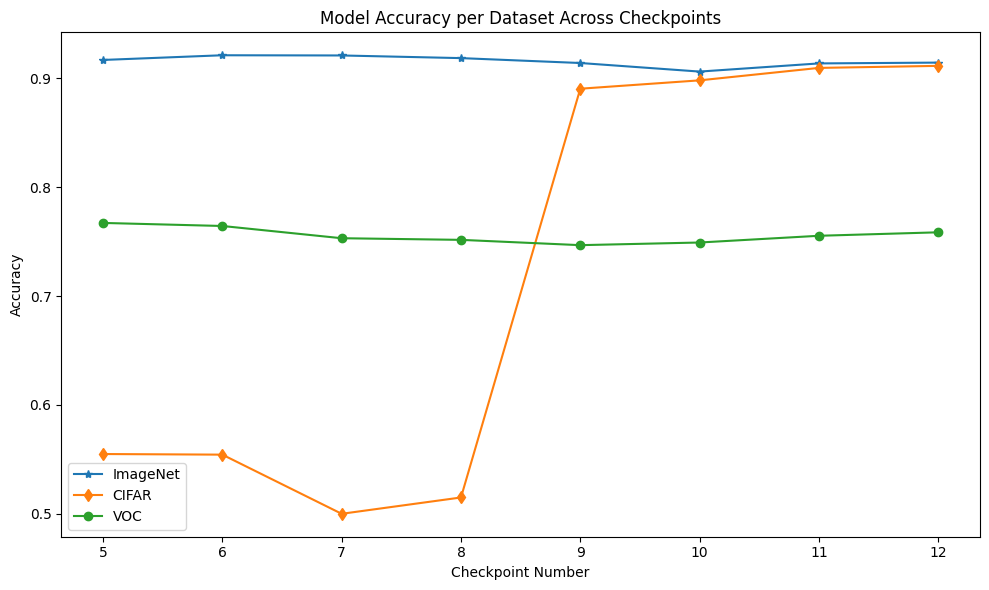

In [ ]:
plt.figure(figsize=(10, 6))

for dataset in dataloaders.keys():
    accuracies = [accuracy_per_checkpoint[checkpoint][dataset] for checkpoint in checkpoint_to_filename.keys()]
    plt.plot(checkpoint_to_filename.keys(), accuracies, label=dataset, marker=dataset_plotting_shape[dataset])

plt.xlabel('Checkpoint Number')
plt.ylabel('Accuracy')
plt.title('Model Accuracy per Dataset Across Checkpoints')
plt.legend()

plt.tight_layout()
plt.show()

Plot overall accuracy and loss

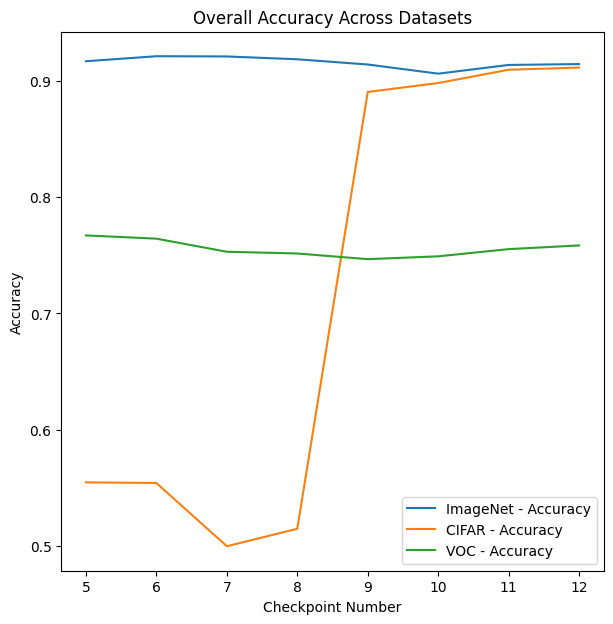

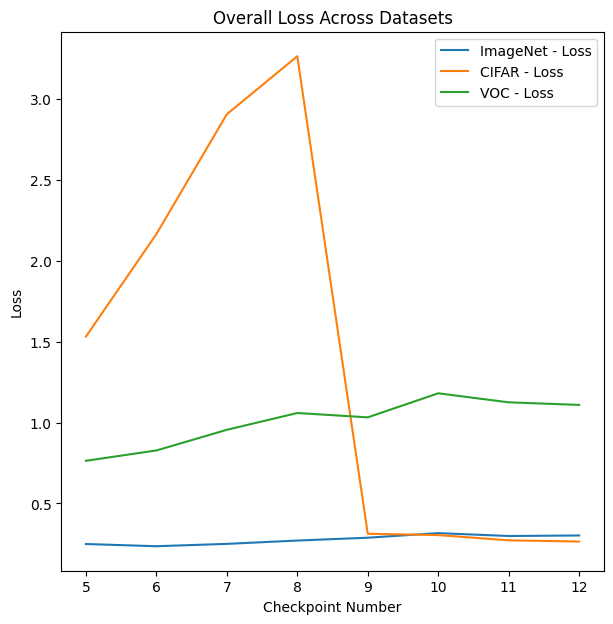

In [ ]:
datasets = list(accuracy_per_checkpoint[next(iter(accuracy_per_checkpoint))].keys())
checkpoint_numbers = sorted(checkpoint_to_filename.keys())

# Accuracy
plt.figure(figsize=(7, 7))
for dataset in datasets:
    accuracies = [accuracy_per_checkpoint[checkpoint][dataset] for checkpoint in checkpoint_numbers]
    plt.plot(checkpoint_numbers, accuracies, label=f'{dataset} - Accuracy')

plt.xlabel('Checkpoint Number')
plt.ylabel('Accuracy')
plt.title('Overall Accuracy Across Datasets')
plt.legend()
plt.show()

# Loss
plt.figure(figsize=(7,7))

for dataset in datasets:
    losses = [loss_per_checkpoint[checkpoint][dataset] for checkpoint in checkpoint_numbers]
    plt.plot(checkpoint_numbers, losses, label=f'{dataset} - Loss')

plt.xlabel('Checkpoint Number')
plt.ylabel('Loss')
plt.title('Overall Loss Across Datasets')
plt.legend()
plt.show()

Plot accuracy metric for each class.

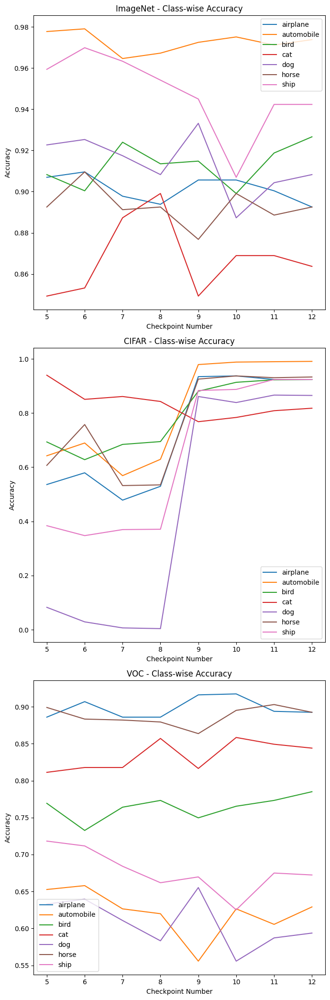

In [ ]:
fig, axes = plt.subplots(len(dataloaders), 1, figsize=(7, len(dataloaders) * 7))

for i, dataset in enumerate(dataloaders.keys()):
    for j in range(NUM_CLASSES):
        class_accuracies = [class_accuracies_per_checkpoint[checkpoint][dataset][j] for checkpoint in checkpoint_to_filename.keys()]
        axes[i].plot(checkpoint_to_filename.keys(), class_accuracies, label=IDX_TO_CLASS[j])

    axes[i].set_title(f'{dataset} - Class-wise Accuracy')
    axes[i].set_xlabel('Checkpoint Number')
    axes[i].set_ylabel('Accuracy')
    axes[i].legend()

plt.tight_layout()
plt.show()

### Manifold

Plot TSNE to observe for dataset and class seperation

In [ ]:
def get_features(model, dataloader):

    """ Extract features, labels, and dataset identifiers for each image in the dataloader."""

    model.eval()

    features = []
    labels = []
    dataset_ids = []

    with torch.no_grad():
        for imgs, lbls, ds_id in dataloader:
            imgs = imgs.to(DEVICE)
            features.append(model(imgs))  # Pass images through the model
            labels.append(lbls)
            dataset_ids.append(ds_id)

    features = torch.cat(features).cpu().numpy()
    labels = torch.cat(labels).cpu().numpy()
    dataset_ids = torch.cat(dataset_ids).cpu().numpy()

    return features, labels, dataset_ids


In [ ]:
dataset_class_plotting_colors = {
 'airplane':{
    'ImageNet': 'lightcoral',
    'CIFAR': 'indianred',
    'VOC': 'brown'
 },
 'automobile':{
    'ImageNet': 'bisque',
    'CIFAR': 'orange',
    'VOC': 'darkorange'
 },
 'bird': {
    'ImageNet': 'khaki',
    'CIFAR': 'goldenrod',
    'VOC': 'darkgoldenrod'
 },
 'cat':{
    'ImageNet': 'palegreen',
    'CIFAR': 'yellowgreen',
    'VOC': 'olivedrab'
 },
 'dog':{
    'ImageNet': 'paleturquoise',
    'CIFAR': 'blue',
    'VOC': 'lightseagreen'
 },
 'horse':{
    'ImageNet': 'powderblue',
    'CIFAR': 'deepskyblue',
    'VOC': 'dodgerblue'
 },
 'ship':{
    'ImageNet': 'plum',
    'CIFAR': 'mediumorchid',
    'VOC': 'indigo'
 }
}

In [ ]:
def plot_tsne(embeddings, labels, dataset_ids, title):

    """Plot a t-SNE visualization of embeddings with different colors and markers for each class and dataset."""

    tsne = TSNE(n_components=2, random_state=123)
    tsne_result = tsne.fit_transform(embeddings)

    plt.figure(figsize=(12, 9))

    for ds_name in DATASET_NAMES:
        for cls_name in CLASS_NAMES:

            # Find the indices for the current dataset and class
            ds_indices = np.where(np.array(DATASET_NAMES)[dataset_ids] == ds_name)[0]
            cls_indices = np.where(np.array(CLASS_NAMES)[labels] == cls_name)[0]
            indices = np.intersect1d(ds_indices, cls_indices)

            scatter = plt.scatter(tsne_result[indices, 0], tsne_result[indices, 1],
                                  color=dataset_class_plotting_colors[cls_name][ds_name],
                                  marker=dataset_plotting_shape[ds_name])


    plt.title(f't-SNE of {title}')

    plt.tight_layout()
    plt.show()

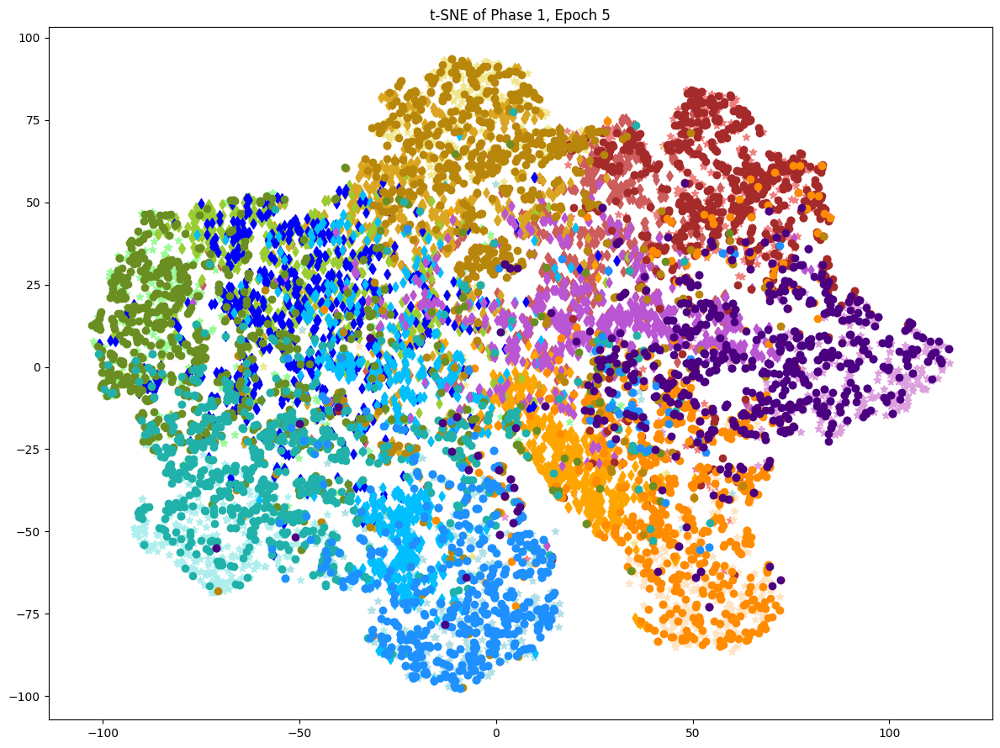

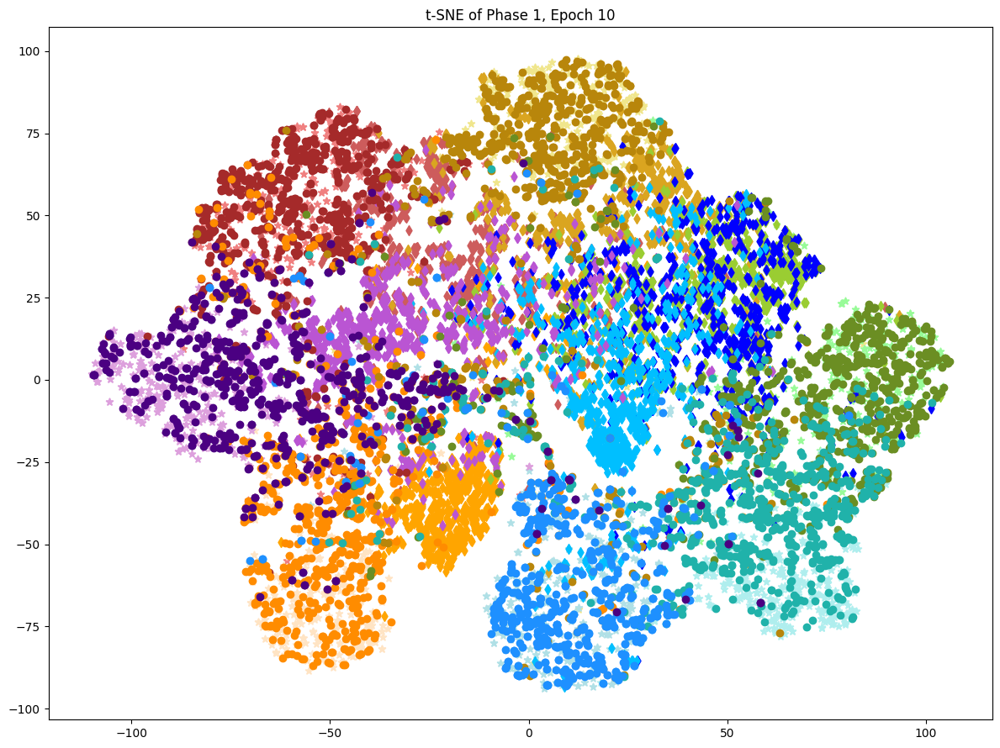

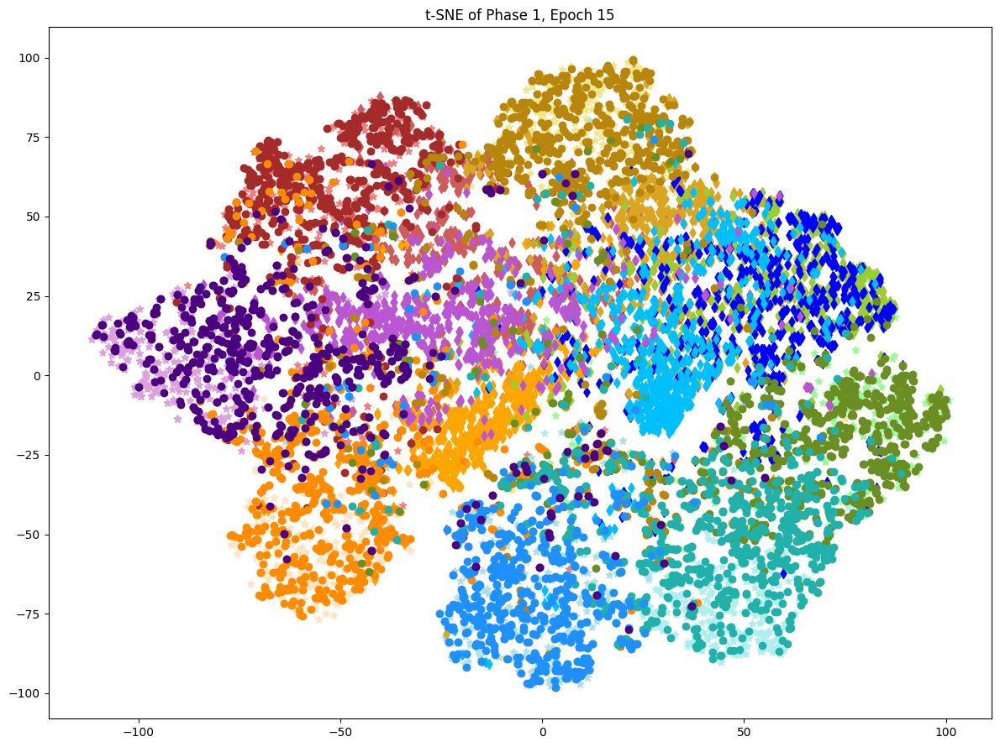

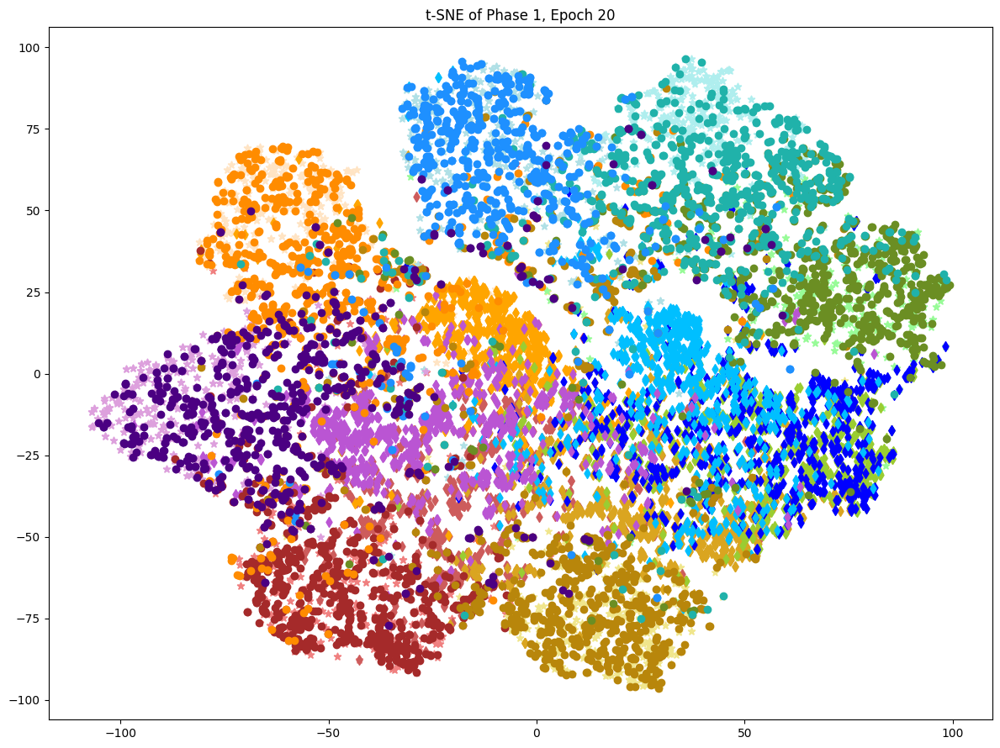

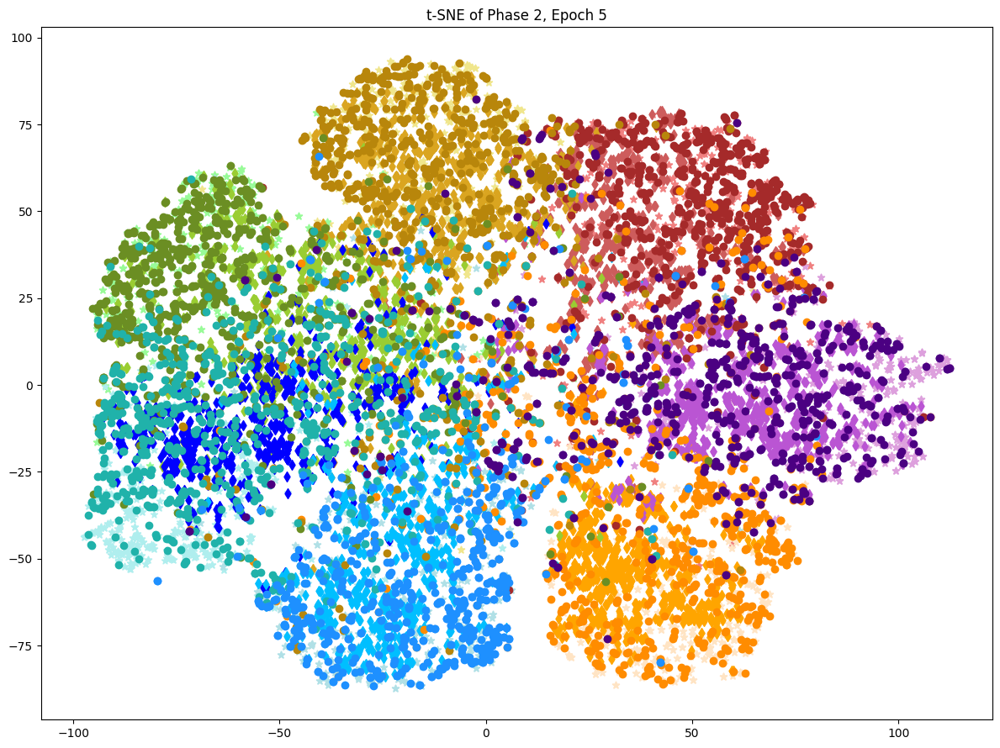

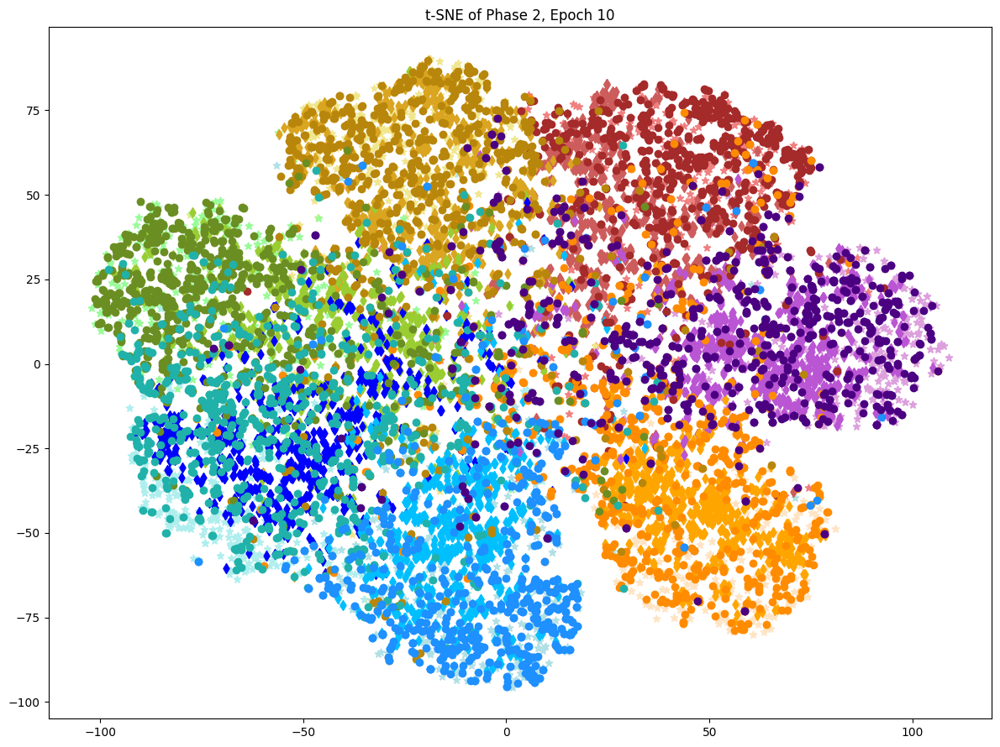

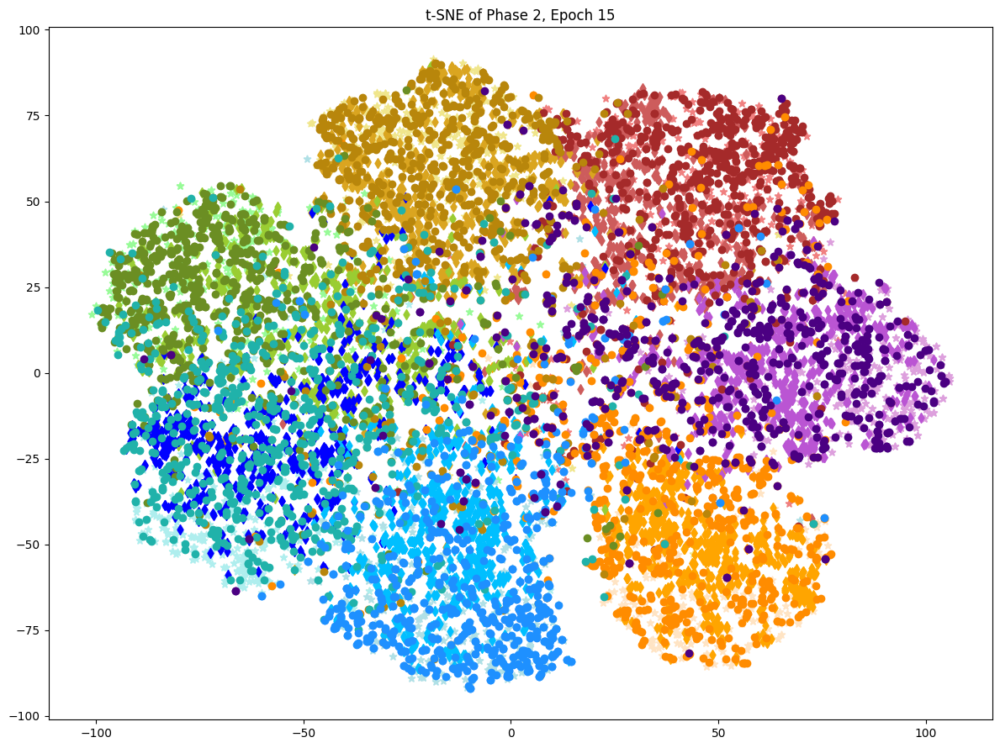

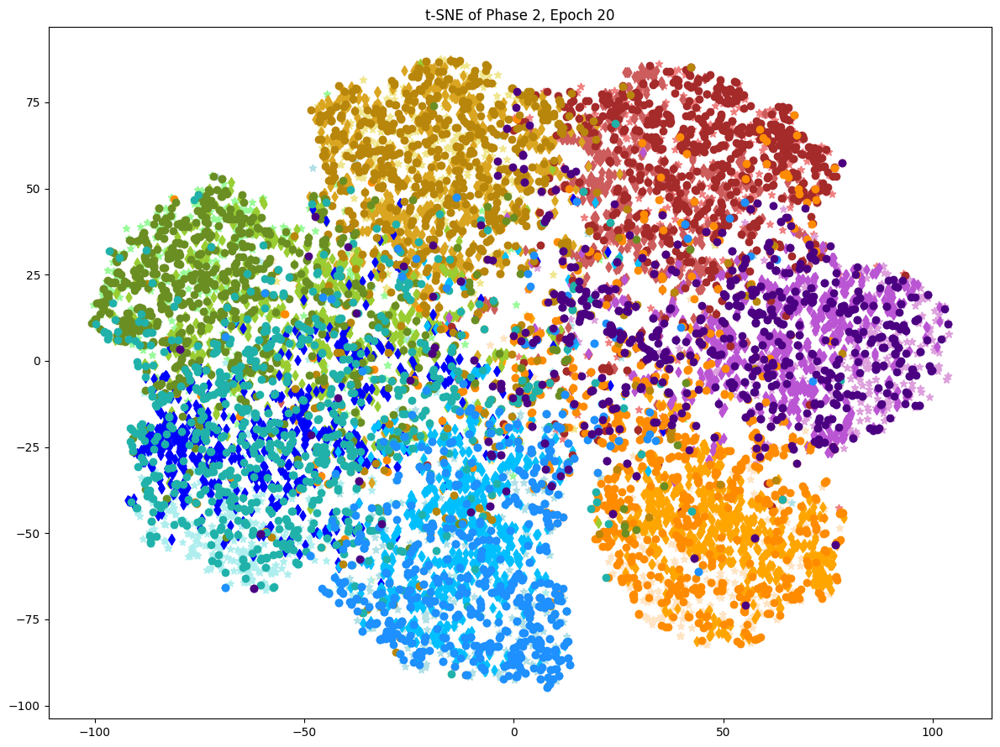

In [ ]:
checkpoint_epochs = list(range(CKPT_INTERVAL, NUM_EPOCHS + CKPT_INTERVAL, CKPT_INTERVAL))
phases = ['1', '2']

for phase in phases:
    for epoch in checkpoint_epochs:
        checkpoint_path = f'{CKPT_DIR}/phase_{phase}/model_checkpoint_epoch{epoch}.pth'
        checkpoint = torch.load(checkpoint_path)

        model.load_state_dict(checkpoint)
        model.to(DEVICE)

        features, labels, dataset_ids = get_features(model, complete_dataloader)
        plot_tsne(features, labels, dataset_ids, f"Phase {phase}, Epoch {epoch}")

### Feature Attention

Create attention maps to identify the most important features per class at the end of each phase of training.

In [ ]:
def preprocess_image(img, size=(224, 224)):

    """Resize and preprocess the given image for model input."""

    img = img.resize(size)
    img = np.array(img)
    img = np.float32(img) / 255
    img_tensor = torch.from_numpy(img).permute(2, 0, 1).unsqueeze(0)

    img_tensor = img_tensor.to(DEVICE)

    return img_tensor, img


def reshape_transform(tensor, height=14, width=14):

    """Reshape and transform a tensor for visualization purposes."""

    # Remove the first token and reshape tensor to the new height and width
    result = tensor[:, 1:, :].reshape(tensor.size(0), height, width, tensor.size(2))

    result = result.transpose(2, 3).transpose(1, 2)
    return result



def get_one_image_per_class(dataloader):

    """Retrieve one image per class from the dataloader."""

    images_per_class = {}
    for images, labels, _ in dataloader:
        for i in range(images.size(0)):  # Iterate through each image in the batch
            label = labels[i].item()
            # Store the first image of each class
            if label not in images_per_class:
                images_per_class[label] = images[i:i+1]

            if len(images_per_class) == NUM_CLASSES:
                return images_per_class
    return images_per_class


In [ ]:
def apply_grad_cam(model, target_layers, img_tensor, target_category=None, reshape_transform=None):

    """Apply Grad-CAM to the specified layers of the model for the given image tensor."""

    cam = GradCAM(model=model, target_layers=target_layers, use_cuda=DEVICE=='cuda', reshape_transform=reshape_transform)
    targets = [ClassifierOutputTarget(target_category)] if target_category else None

    img_tensor = img_tensor.to(DEVICE)

    grayscale_cam = cam(input_tensor=img_tensor, targets=targets)
    return grayscale_cam[0, :]

def visualize_cam_on_image(img, cam):

    """Overlay the Grad-CAM heatmap on the original image."""

    cam = cam - np.min(cam)
    cam = cam / np.max(cam)
    cam = np.uint8(255 * cam)
    return show_cam_on_image(img, cam, use_rgb=True)

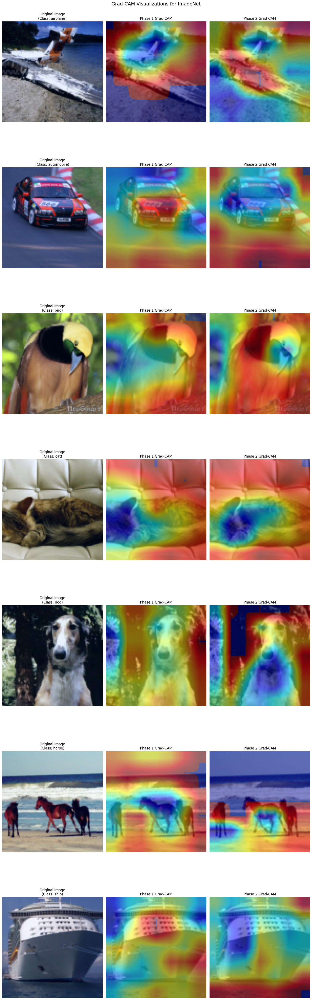

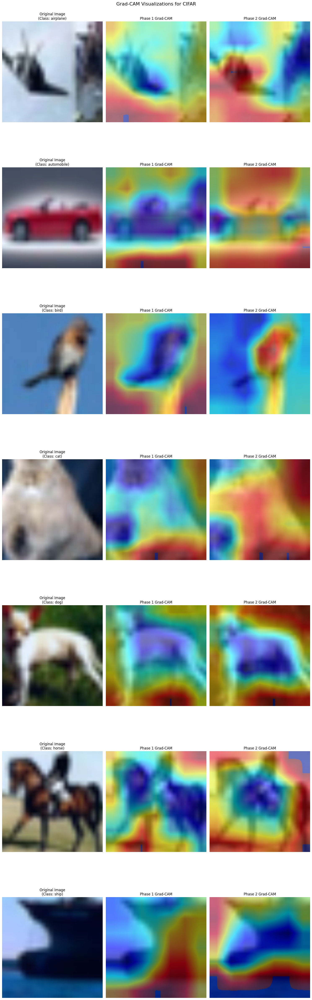

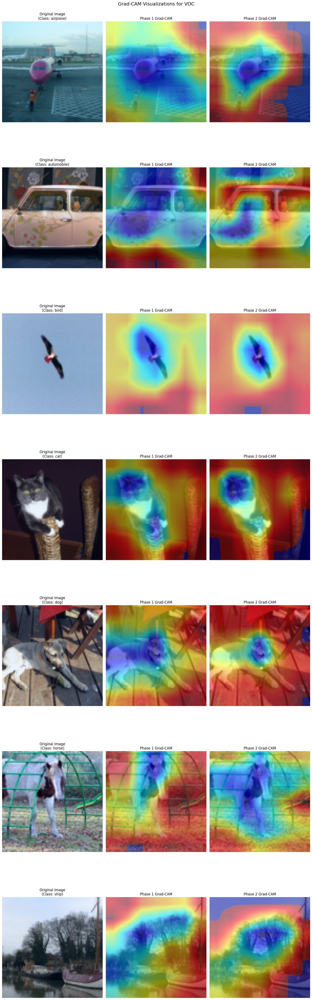

In [ ]:
checkpoint_epochs = [NUM_EPOCHS]

for loader_name, dataloader in dataloaders.items():
  # Process each phase and populate the corresponding columns
  images_per_class = get_one_image_per_class(dataloader)
  fig, axes = plt.subplots(len(images_per_class), len(phases) + 1, figsize=(15, 50))

  for phase_idx, phase in enumerate(phases):
      for epoch in checkpoint_epochs:
          checkpoint_path =  f'{CKPT_DIR}/phase_{phase}/model_checkpoint_epoch{epoch}.pth'
          checkpoint = torch.load(checkpoint_path)

          model.load_state_dict(checkpoint)
          model.to(DEVICE)
          model.eval()

          target_layers = [model._blocks[-1]]

          # Apply Grad-CAM for each image and populate the plot
          for i, (class_idx, img_tensor) in enumerate(images_per_class.items()):
              img_tensor_cpu = img_tensor.squeeze().permute(1, 2, 0).numpy()
              img_tensor_cpu = (img_tensor_cpu - img_tensor_cpu.min()) / (img_tensor_cpu.max() - img_tensor_cpu.min())
              img_pil = Image.fromarray(np.uint8(255 * img_tensor_cpu))
              img_tensor, img = preprocess_image(img_pil)

              if phase_idx == 0 and epoch == checkpoint_epochs[0]:
                  axes[i, 0].imshow(img_pil)
                  axes[i, 0].set_title(f'Original Image\n(Class: {CLASS_NAMES[class_idx]})')
                  axes[i, 0].axis('off')

              effnet_cam = apply_grad_cam(model, target_layers, img_tensor)
              effnet_visualization = visualize_cam_on_image(img, effnet_cam)

              axes[i, phase_idx + 1].imshow(effnet_visualization)
              axes[i, phase_idx + 1].set_title(f'Phase {phase} Grad-CAM')
              axes[i, phase_idx + 1].axis('off')

  fig.suptitle(f"Grad-CAM Visualizations for {loader_name}", fontsize=16)

  plt.tight_layout()
  plt.show()
